In [1]:
import pandas as pd

data = pd.read_csv('data/anamnesis_translated.csv')

In [2]:
data.dropna(inplace=True)

In [3]:
feature_columns = list(data.columns)[:7]
target_columns = list(data.columns)[7:]

# binary target columns
binary_target_columns = [col for col in target_columns if data[col].nunique() == 2]
# non-binary target columns
non_binary_target_columns = [col for col in target_columns if data[col].nunique() != 2]

In [4]:
feature_columns

['Misalignment_Movement_Avg_left',
 'Misalignment_Movement_Avg_right',
 'Misalignment_Rest_Avg_left',
 'Misalignment_Rest_Avg_right',
 'Gait_Avg_left',
 'Gait_Avg_right',
 'ShoeSize']

In [5]:
binary_target_columns

['Pain_Forefoot_Left',
 'Pain_Forefoot_Right',
 'Pain_Midfoot_Left',
 'Pain_Midfoot_Right',
 'Pain_Heel_Left',
 'Pain_Heel_Right',
 'Pain_Wrist_Left',
 'Pain_Wrist_Right',
 'Pain_Elbow_Left',
 'Pain_Elbow_Right',
 'Pain_Finger_Left',
 'Pain_Finger_Right',
 'Pain_Upper_Arm_Left',
 'Pain_Upper_Arm_Right',
 'Pain_Thumb_Left',
 'Pain_Thumb_Right',
 'Pain_Forearm_Left',
 'Pain_Forearm_Right']

In [6]:
non_binary_target_columns

['Pain_Forehead',
 'Pain_Crown',
 'Pain_Neck_Muscles',
 'Pain_Cervical_Spine',
 'Pain_Thoracic_Spine',
 'Pain_Shoulder_Arm_Left',
 'Pain_Shoulder_Arm_Right',
 'Pain_Lumbar_Spine',
 'Pain_Hip_Left',
 'Pain_Hip_Right',
 'Pain_Buttock_Thigh_Left',
 'Pain_Buttock_Thigh_Right',
 'Pain_Knee_Left',
 'Pain_Knee_Right',
 'Pain_Lower_Leg_Left',
 'Pain_Lower_Leg_Right',
 'Pain_Ankle_Left',
 'Pain_Ankle_Right',
 'Restless_Legs_Syndrome',
 'Dizziness_Fall_Tendency',
 'Body_Vibration',
 'Restless_Sleep',
 'Lack_Of_Drive',
 'Concentration_Difficulty']

In [7]:
for target_col in target_columns:
    print(data[target_col].unique())

[0. 1.]
[1. 0.]
[0. 1.]
[0. 1.]
[1. 0.]
[1. 0.]
[0. 3. 1. 2. 4. 5.]
[0. 5. 1. 3. 2. 4.]
[3. 2. 1. 0. 5. 4.]
[3. 0. 2. 5. 1. 4.]
[5. 0. 3. 4. 1. 2.]
[0. 2. 5. 3. 1. 4.]
[3. 0. 2. 5. 1. 4.]
[5. 3. 0. 4. 2. 1.]
[2. 0. 5. 1. 3. 4.]
[4. 0. 5. 2. 3. 1.]
[2. 0. 1. 3. 4. 5.]
[5. 0. 1. 2. 3. 4.]
[2. 0. 1. 5. 3. 4.]
[1. 0. 2. 5. 4. 3.]
[0. 2. 5. 1. 4. 3.]
[1. 0. 2. 5. 4. 3.]
[3. 0. 5. 4. 1. 2.]
[4. 0. 5. 3. 2. 1.]
[0. 5. 1. 2. 3. 4.]
[0. 1. 5. 4. 3. 2.]
[1. 0. 5. 3. 2. 4.]
[3. 4. 0. 5. 1. 2.]
[2. 0. 1. 4. 5. 3.]
[1. 3. 2. 0. 4. 5.]
[0. 1.]
[0. 1.]
[0. 1.]
[0. 1.]
[0. 1.]
[0. 1.]
[0. 1.]
[0. 1.]
[0. 1.]
[0. 1.]
[0. 1.]
[0. 1.]


---

## 1. Normalize Features and Remove Outliers 
- This is necessary because SMOTE uses distance based clustering

https://velog.io/@masew8/스케일러-3종-비교-Min-Max-Standard-Robust-Scaler#:~:text=Min%2DMax%20Scaler는%20모든%20데이터를%200과%201,최적화%20알고리즘에%20적합합니다. 

In [8]:
# normalize features
from sklearn.preprocessing import MinMaxScaler 

def scale_features(data, feature_columns):
    # Drop rows with missing values 
    data = data.dropna()
    
    # Drop rows with outliers 
    outlier_indices = get_outlier_indices(data[feature_columns]) 
    data = data.drop(outlier_indices)
    
    # Normalized Features 
    scaler = MinMaxScaler()
    data[feature_columns] = scaler.fit_transform(data[feature_columns])
    
    return data 

def get_outlier_indices(df):
    # Calculate Q1 (25th percentile) and Q3 (75th percentile) for each column
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1

    # Determine outliers for each column
    is_outlier = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR)))

    # Identify rows that have outliers in any column
    outlier_rows = is_outlier.any(axis=1)

    # Return indices of rows with outliers
    outlier_indices = df.index[outlier_rows]

    return outlier_indices    

In [9]:
scaled_data = scale_features(data, feature_columns)
scaled_data

,Misalignment_Movement_Avg_left,Misalignment_Movement_Avg_right,Misalignment_Rest_Avg_left,Misalignment_Rest_Avg_right,Gait_Avg_left,Gait_Avg_right,ShoeSize,Pain_Forefoot_Left,Pain_Forefoot_Right,Pain_Midfoot_Left,...,Pain_Elbow_Left,Pain_Elbow_Right,Pain_Finger_Left,Pain_Finger_Right,Pain_Upper_Arm_Left,Pain_Upper_Arm_Right,Pain_Thumb_Left,Pain_Thumb_Right,Pain_Forearm_Left,Pain_Forearm_Right
1,0.474684,0.630058,0.431655,0.680000,0.604651,0.465116,0.153846,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.449367,0.618497,0.424460,0.633333,0.697674,0.651163,0.153846,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.607595,0.543353,0.676259,0.526667,0.302326,0.232558,0.846154,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.082278,0.161850,0.374101,0.186667,0.465116,0.255814,0.692308,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.405063,0.132948,0.482014,0.360000,0.558140,0.279070,0.692308,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2597,0.677215,0.445087,0.618705,0.460000,0.813953,0.744186,0.307692,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2598,0.734177,0.583815,0.366906,0.520000,0.720930,0.744186,0.307692,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2599,0.563291,0.566474,0.604317,0.546667,0.302326,0.395349,0.307692,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2600,0.215190,0.341040,0.151079,0.273333,0.534884,0.534884,0.230769,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


---

## 2. Choose Feature Columns to Use
- Drop Gait_Avg_Left, Gait_Avg_Right ( High Correlation, Very High VIF)
- Drop Misalignment_Rest_Avg_XXX, and keep only Misalignment_Rest_Avg_XXX  ( High Correlation, Moederate VIF ) 

In [10]:
feature_columns

['Misalignment_Movement_Avg_left',
 'Misalignment_Movement_Avg_right',
 'Misalignment_Rest_Avg_left',
 'Misalignment_Rest_Avg_right',
 'Gait_Avg_left',
 'Gait_Avg_right',
 'ShoeSize']

In [11]:
def drop_redundant_cols(data, drop_columns):
    data = data.drop(columns=drop_columns)
    return data

# columns to drop 
drop_columns = ['Gait_Avg_right', 'Gait_Avg_left', 'Misalignment_Rest_Avg_right', 'Misalignment_Rest_Avg_left']

# define new feature columns to use 
new_feature_columns = [col for col in feature_columns if col not in drop_columns]

# drop columns 
processed_data = drop_redundant_cols(scaled_data, drop_columns) 
processed_data

,Misalignment_Movement_Avg_left,Misalignment_Movement_Avg_right,ShoeSize,Pain_Forefoot_Left,Pain_Forefoot_Right,Pain_Midfoot_Left,Pain_Midfoot_Right,Pain_Heel_Left,Pain_Heel_Right,Pain_Forehead,...,Pain_Elbow_Left,Pain_Elbow_Right,Pain_Finger_Left,Pain_Finger_Right,Pain_Upper_Arm_Left,Pain_Upper_Arm_Right,Pain_Thumb_Left,Pain_Thumb_Right,Pain_Forearm_Left,Pain_Forearm_Right
1,0.474684,0.630058,0.153846,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.449367,0.618497,0.153846,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.607595,0.543353,0.846154,0.0,0.0,0.0,0.0,0.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.082278,0.161850,0.692308,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.405063,0.132948,0.692308,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2597,0.677215,0.445087,0.307692,1.0,1.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2598,0.734177,0.583815,0.307692,1.0,1.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2599,0.563291,0.566474,0.307692,1.0,1.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2600,0.215190,0.341040,0.230769,0.0,0.0,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


---

## 3. Inspect Class Distribution 


https://mkjjo.github.io/python/2019/01/04/smote_duplicate.html

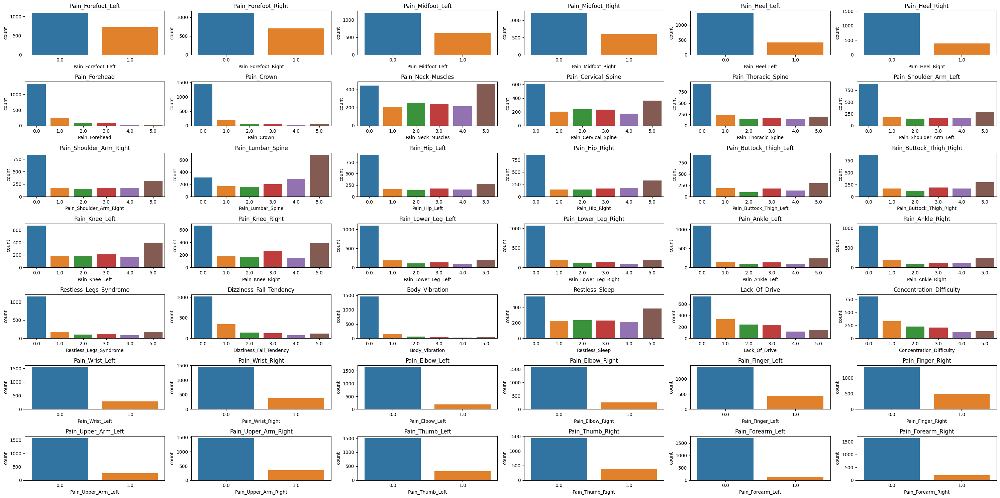

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns 

def plot_barplot_target(data, target_columns):
    plt.figure(figsize=(30, 15))
    n_cols = 6
    n_rows = (len(target_columns) + n_cols - 1) // n_cols 
    
    target_data = data[target_columns]
    for idx, target_col in enumerate(target_columns):
        plt.subplot(n_rows, n_cols, idx+1)
        sns.countplot(x=target_col, data=target_data)
        plt.title(target_col)
        plt.tight_layout()
    plt.show()
    
plot_barplot_target(processed_data, target_columns)

---

## 4. Imabalanced Classes Augmentation ( Oversampling - SMOTE)
SMOTE
- create synthetic features for minor classes. ( Oversampling Technique )
    - SMOTE uses KNN to create synthetic data per each class in target columns. 
        - Generated synthetic data(feature columns) lie within the feature space spanned by KNN clusters.
        - Generated Synthetic data(feature columns) have the similar values to the original values for each class in target columns.






Process to augment the imbalanced classes
1. Applied SMOTE for each Feature Column 
- Loop over each feature column
    - Feature data for each class from each feature column are generated.
    - According, the current target column is filled with the corresponding class.
    - However, Other target columns are filled with NaN values. 



2. Cluster Data per Class for Each Column Using KMeans
    - Perform KMeans clustering separately for each target column.
        - Set the number of clusters to 5, similar to how SMOTE operates.
        - Use the specified feature space (new_feature_columns) for clustering.
        - Assign a cluster label to each row based on KMeans clustering results.
    - Add the cluster labels as a new column ({target_col}_cluster_label) to the dataset.
    - These clusters will help decide NaN class labels based on the feature space used in SMOTE.

3. Fill NaN Target Column Values  
    - Loop over each target column and process clusters separately:
      - Identify rows with NaN values in the target column for each cluster.
        - Compute the Euclidean distance between rows with NaN values and rows with non-NaN values.
            - Find the nearest rows that have valid (non-NaN) target values.
        - Randomly sample one value from these nearest rows to fill each NaN value.
            - Added weights so the nearest data points have higher probability to be sampled. 
        - Replace the NaN value with the sampled value.


Other techniques : 
- https://www.analyticsvidhya.com/blog/2020/10/overcoming-class-imbalance-using-smote-techniques/  
-https://medium.com/towards-data-science/class-imbalance-strategies-a-visual-guide-with-code-8bc8fae71e1a  


#### Undersampling 
After filling the NaN values, the class distribution is still imbalanced.   
 - NearMiss-1 selects the samples from the majority class that are closest to the k nearest neighbors from the minority class. 
 - NearMiss-2 selects the samples from the majority class that are farthest from the k farthest neighbors from the minority class. 
 - NearMiss-3 selects the samples from the majority class that have the smallest average distance to k nearest neighbors from the minority class.


https://www.linkedin.com/advice/1/what-best-techniques-undersampling-machine-learning-2en4c  
https://www.kdnuggets.com/undersampling-techniques-using-python#:~:text=NearMiss%20is%20an%20undersampling%20technique,space%20between%20the%20two%20classes  
https://www.youtube.com/watch?v=luoeyiX6Xf8
  
https://www.youtube.com/watch?v=EKiiqOGBrXc
https://imbalanced-learn.org/stable/references/generated/imblearn.under_sampling.NearMiss.html

In [13]:
# !pip install imbalanced-learn

#### 4.1. Oversampling using SMOTE 

In [14]:
!pip3 install imbalanced-learn

In [120]:
import pandas as pd
from imblearn.over_sampling import SMOTE #, SMOTENC
from imblearn.combine import SMOTETomek

def perform_smote_resampling(processed_data, feature_columns, target_columns, k_neighbors=5, random_state=42):
    # Dictionary to store resampled data for each target column
    resampled_data_dict = {}

    # Iterate over each target column
    for target_col in target_columns:
        # Use SMOTE for categorical target columns
        smtom = SMOTETomek(sampling_strategy='auto', random_state=random_state)
        X_resampled, y_resampled = smtom.fit_resample(processed_data[feature_columns], processed_data[target_col]) # Result data contain the original data and the resampled data 
        
        # Create a DataFrame for the resampled data
        resampled_data = pd.DataFrame(X_resampled, columns=feature_columns)
        resampled_data[target_col] = y_resampled
        
        # Store the resampled data in the dictionary
        resampled_data_dict[target_col] = resampled_data

    # Combine all resampled data into a single DataFrame
    smtom_data = pd.concat(resampled_data_dict.values(), ignore_index=True)
    
    # SMOTE may resample and generate duplicate feature values, as the same feature values are used per each iteration 
    # Group By the Same Features, fill NaN values(bfill, ffill), and get the first row 
    smtom_data = smtom_data.groupby(feature_columns).agg(lambda x: x.bfill().ffill().iloc[0]).reset_index()

    return smtom_data

# Example usage
smtom_data = perform_smote_resampling(processed_data, new_feature_columns, target_columns)

In [121]:
smtom_data.isna().sum().max()

98279

In [122]:
len(smtom_data)

100064

In [123]:
smtom_data[new_feature_columns].duplicated().sum()

0

In [124]:
print(f'Original Data : {len(processed_data)}')
print(f'Common Rows : {len(pd.merge(smtom_data, processed_data, on=new_feature_columns+target_columns, how="inner"))}')

Original Data : 1819
Common Rows : 149


In [125]:
smtom_data

,Misalignment_Movement_Avg_left,Misalignment_Movement_Avg_right,ShoeSize,Pain_Forefoot_Left,Pain_Forefoot_Right,Pain_Midfoot_Left,Pain_Midfoot_Right,Pain_Heel_Left,Pain_Heel_Right,Pain_Forehead,...,Pain_Elbow_Left,Pain_Elbow_Right,Pain_Finger_Left,Pain_Finger_Right,Pain_Upper_Arm_Left,Pain_Upper_Arm_Right,Pain_Thumb_Left,Pain_Thumb_Right,Pain_Forearm_Left,Pain_Forearm_Right
0,0.000000,0.323699,0.384615,1.0,0.0,1.0,1.0,1.0,1.0,NaN,...,NaN,1.0,NaN,NaN,1.0,1.0,1.0,1.0,0.0,1.0
1,0.000000,0.329480,0.153846,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.336276,0.328826,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.000000,0.341040,0.307692,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,NaN,1.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000085,0.329673,0.154876,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100059,0.993671,0.549133,0.307692,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100060,0.993671,0.661757,0.272007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100061,0.993671,0.791908,0.230769,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100062,0.997728,0.110272,0.540586,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### 4.2. Cluster the dataset using the feature columns 

In [126]:
from sklearn.cluster import KMeans

def kmeans_clustering_each_target(smtom_data, new_feature_columns, target_columns):
    # for target_col in target_columns + ['ShoeSize']:
    for target_col in target_columns:
        
        n_clusters = 5 # SMOTE uses 5 clusters 
        
        # Select features for clustering
        X = smtom_data[new_feature_columns].values

        # Perform K-Means clustering
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        labels = kmeans.fit_predict(X)

        # Add cluster labels to the dataframe for each target column
        smtom_data[f'{target_col}_cluster_label'] = labels
    
    return smtom_data

# Example usage
clustered_data = kmeans_clustering_each_target(smtom_data, new_feature_columns, target_columns)

In [127]:
clustered_data

,Misalignment_Movement_Avg_left,Misalignment_Movement_Avg_right,ShoeSize,Pain_Forefoot_Left,Pain_Forefoot_Right,Pain_Midfoot_Left,Pain_Midfoot_Right,Pain_Heel_Left,Pain_Heel_Right,Pain_Forehead,...,Pain_Elbow_Left_cluster_label,Pain_Elbow_Right_cluster_label,Pain_Finger_Left_cluster_label,Pain_Finger_Right_cluster_label,Pain_Upper_Arm_Left_cluster_label,Pain_Upper_Arm_Right_cluster_label,Pain_Thumb_Left_cluster_label,Pain_Thumb_Right_cluster_label,Pain_Forearm_Left_cluster_label,Pain_Forearm_Right_cluster_label
0,0.000000,0.323699,0.384615,1.0,0.0,1.0,1.0,1.0,1.0,NaN,...,2,2,2,2,2,2,2,2,2,2
1,0.000000,0.329480,0.153846,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2,2,2,2,2,2,2,2,2,2
2,0.000000,0.336276,0.328826,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2,2,2,2,2,2,2,2,2,2
3,0.000000,0.341040,0.307692,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,2,2,2,2,2,2,2,2,2,2
4,0.000085,0.329673,0.154876,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2,2,2,2,2,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100059,0.993671,0.549133,0.307692,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,4,4,4,4,4,4,4,4,4,4
100060,0.993671,0.661757,0.272007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4,4,4,4,4,4,4,4,4,4
100061,0.993671,0.791908,0.230769,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,4,4,4,4,4,4,4,4,4,4
100062,0.997728,0.110272,0.540586,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,1,1,1,1,1,1,1,1


#### 4.3. Fill NaN column values

In [128]:
import numpy as np
import pandas as pd
from sklearn.neighbors import NearestNeighbors

def fill_nan_with_weighted_knn(data, feature_columns, target_columns, num_nearest=5):
    filled_data = data.copy()  # Prevent modification of the original data

    for target_col in target_columns:
        cluster_label_col = f'{target_col}_cluster_label'
        cluster_groups = {cluster: df for cluster, df in filled_data.groupby(cluster_label_col)}

        for cluster_label, cluster_data in cluster_groups.items():
            nan_rows = cluster_data[cluster_data[target_col].isna()]
            non_nan_rows = cluster_data.dropna(subset=[target_col])

            if nan_rows.empty or non_nan_rows.empty:
                continue  # Skip if no NaN or no valid reference data

            # Fit Nearest Neighbors model
            nn_model = NearestNeighbors(n_neighbors=min(num_nearest, len(non_nan_rows)), metric='euclidean')
            nn_model.fit(non_nan_rows[feature_columns])

            # Find nearest neighbors for NaN rows
            distances, indices = nn_model.kneighbors(nan_rows[feature_columns])

            # Compute inverse distance weights (closer neighbors get higher weights)
            weights = 1 / (distances + 1e-5)  # Adding a small value to prevent division by zero
            weights /= weights.sum(axis=1, keepdims=True)  # Normalize weights

            # Sample from nearest neighbors based on weights
            sampled_values = np.array([
                np.random.choice(non_nan_rows.iloc[indices[i]][target_col].values, p=weights[i])
                for i in range(len(nan_rows))
            ])

            # Update NaN values
            filled_data.loc[nan_rows.index, target_col] = sampled_values

    return filled_data

smtom_data_filled = fill_nan_with_weighted_knn(clustered_data, new_feature_columns, target_columns)


In [129]:
# Check if there are any NaN values in the DataFrame
smtom_data_filled.isna().sum(axis=1).sum()

0

In [130]:
smtom_data_filled[new_feature_columns].duplicated().sum()

0

In [131]:
len(pd.merge(smtom_data_filled, processed_data, on=new_feature_columns+target_columns, how='inner'))

200

In [132]:
# keep only the feature columns and target columns 
smtom_data_filled = smtom_data_filled[new_feature_columns + target_columns]
smtom_data_filled

,Misalignment_Movement_Avg_left,Misalignment_Movement_Avg_right,ShoeSize,Pain_Forefoot_Left,Pain_Forefoot_Right,Pain_Midfoot_Left,Pain_Midfoot_Right,Pain_Heel_Left,Pain_Heel_Right,Pain_Forehead,...,Pain_Elbow_Left,Pain_Elbow_Right,Pain_Finger_Left,Pain_Finger_Right,Pain_Upper_Arm_Left,Pain_Upper_Arm_Right,Pain_Thumb_Left,Pain_Thumb_Right,Pain_Forearm_Left,Pain_Forearm_Right
0,0.000000,0.323699,0.384615,1.0,0.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0
1,0.000000,0.329480,0.153846,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.336276,0.328826,1.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
3,0.000000,0.341040,0.307692,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000085,0.329673,0.154876,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100059,0.993671,0.549133,0.307692,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100060,0.993671,0.661757,0.272007,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0
100061,0.993671,0.791908,0.230769,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100062,0.997728,0.110272,0.540586,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### 4.5. Check the class balance after SMOTE and SMOTE+Tomek Links 

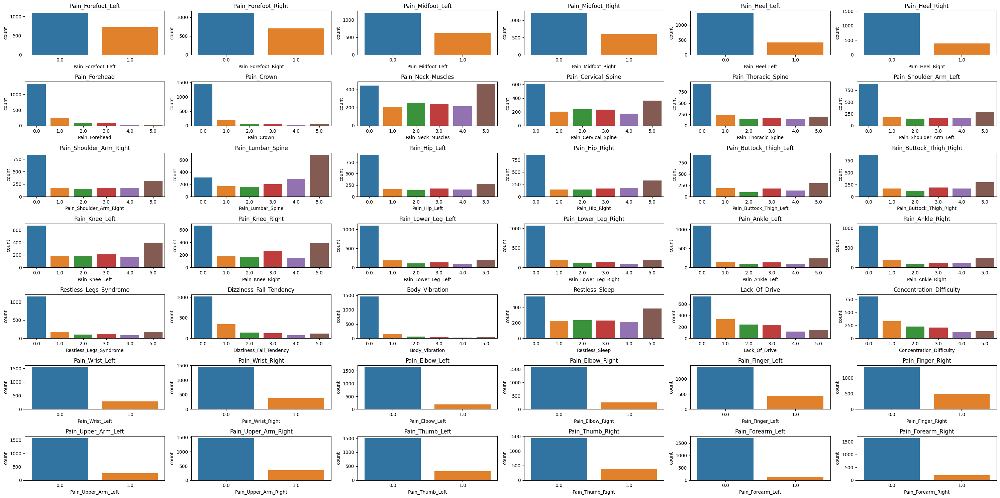

In [133]:
plot_barplot_target(processed_data, target_columns)

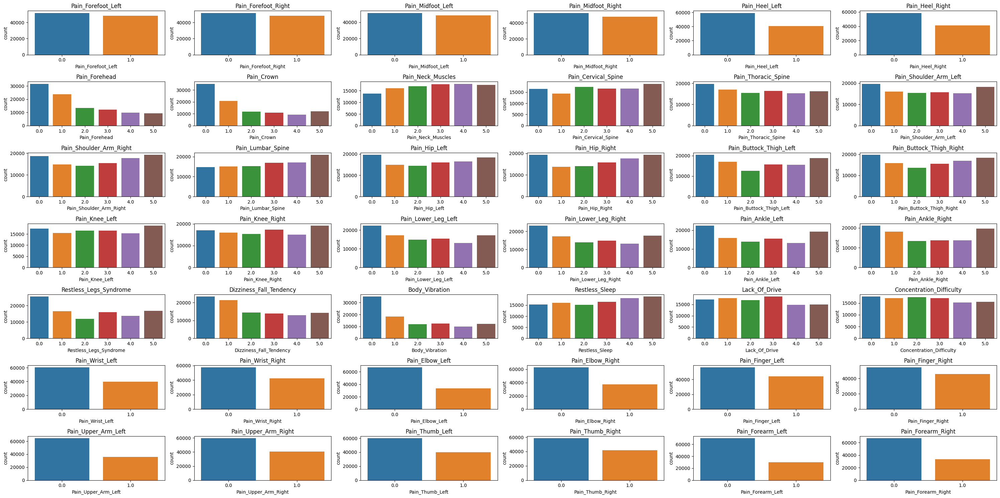

In [134]:
plot_barplot_target(smtom_data_filled, target_columns)

In [135]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

def plot_3d_scatter(data, feature_cols, target_col, width=800, height=500):
    
    x_col, y_col, z_col = feature_cols[0], feature_cols[1], feature_cols[2]
    
    # Reset indices to ensure alignment
    data = data.reset_index(drop=True)
    
    # Create the 3D scatter plot
    fig = go.Figure()
    
    # Get unique target values
    targets = sorted(data[target_col].unique())
    
    # Generate colors dynamically based on number of targets
    if len(targets) <= 10:
        colors = px.colors.qualitative.Set1[:len(targets)]  # Using Plotly's built-in color sequences
    else:
        colors = px.colors.qualitative.Light24[:len(targets)]  # Use a larger color palette if more than 10 targets
    
    # Create scatter plot for each target value
    for target, color in zip(targets, colors):
        indices_to_keep = data[target_col] == target
        
        # Skip if no data points match the target
        if not indices_to_keep.any():
            print(f"No data points found for target {target}. Skipping.")
            continue
        
        fig.add_trace(go.Scatter3d(
            x=data.loc[indices_to_keep, x_col],
            y=data.loc[indices_to_keep, y_col],
            z=data.loc[indices_to_keep, z_col],
            mode='markers',
            marker=dict(size=5, color=color),
            name=f'Target {target}'
        ))
    
    # Update layout
    fig.update_layout(
        title=f'Target Column : {target_col}',
        scene=dict(
            xaxis_title=x_col,
            yaxis_title=y_col,
            zaxis_title=z_col
        ),
        width=width,
        height=height,
        margin=dict(l=0, r=0, b=0, t=30)  # Adjust margins for better layout
    )
    
    fig.show()

#### 4.6. Visualize the resampled data in an 3D interactive plot 
- each axis corresponds to the features used 

##### Before SMOTE

In [136]:
plot_3d_scatter(processed_data, new_feature_columns, target_columns[15])

##### After SMOTE+Tomek Links

In [137]:
plot_3d_scatter(smtom_data_filled, new_feature_columns, target_columns[15])

#### 4.7. Save the resampled data 

In [138]:
smtom_data_filled.to_excel('data/data_EDA_2_1_SMOTETomek.xlsx', index=False)

---

## 5. Evaluate the Class Balance ( Shannon Entropy )

- Shannon Entropy is defined as   
    - **$H(X) = - \sum_{i=1}^{n} p(x_i) \log_2 p(x_i)$**, where $p(x_i)$ is the probability of the $i$-th class. 
    - $H_{max} = \log_2 n$, when all classes are equally likely. 
        - binary target columns(0, 1): $\log_2 2 = 1$
        - 6-class target columns(0, 1, 2, 3, 4, 5): $\log_2 6 \approx 2.58$

- Interpretation of Shannon Entropy:
    - $H(X) \approx 0$ : Severe class imbalance. 
    - $H(X)$ close to $H_{max}$ : Classes are mostly balanced. 

https://stats.stackexchange.com/questions/239973/a-general-measure-of-data-set-imbalance

In [139]:
# smtom_data_filled.head()

#### 5.1. Define a function to calculate Shannon Entropy 

In [140]:
import pandas as pd
import numpy as np

# Function to calculate Shannon Entropy
def calculate_shannon_entropy(class_counts):
    total = sum(class_counts)
    probabilities = [count / total for count in class_counts]
    entropy = -sum(p * np.log2(p) for p in probabilities if p > 0)
    return entropy

# Calculate Shannon Entropy for each target column
def measure_class_balance_with_entropy(data, target_columns, silence=True):
    entropy_info = {}
    for col in target_columns:
        class_counts = data[col].value_counts()
        entropy = calculate_shannon_entropy(class_counts)
        entropy_info[col] = {
            'class_counts': class_counts.to_dict(),
            'entropy': entropy
        }
    # Convert the dictionary to a DataFrame
    entropy_df = pd.DataFrame.from_dict(entropy_info, orient='index')
    
    # Print results
    if not silence:
        for _, info in entropy_df.iterrows():
            print(f"Feature: {info.name}")
        print(f"Class Counts: {info.class_counts}")
        print(f"Shannon Entropy: {info.entropy:.4f}")
        print("-" * 40)
        
    return entropy_df


#### 5.2. Define a function to plot the Shannon Entropy 

In [141]:
import matplotlib.pyplot as plt

def plot_shannon_entropy(entropy_info, binary_target_columns, non_binary_target_columns, resampled=False):
    plt.figure(figsize=(30, 6))
    
    # Plot for binary target columns
    plt.subplot(1, 2, 1)
    entropy_info.loc[binary_target_columns, 'entropy'].plot(kind='bar', color='skyblue')  
    if resampled:
        plt.title('Shannon Entropy of Binary Target Columns\n(resampled data)')
    else:
        plt.title('Shannon Entropy of Binary Target Columns')
    plt.xlabel('Binary Target Columns')
    plt.ylabel('Shannon Entropy')
    plt.ylim(0, 2.6)
    plt.grid(axis='y', which='major', linestyle='--', linewidth=0.5)
    plt.xticks(rotation=90)

    # Plot for non-binary target columns
    plt.subplot(1, 2, 2)
    entropy_info.loc[non_binary_target_columns, 'entropy'].plot(kind='bar', color='salmon') 
    if resampled:
        plt.title('Shannon Entropy of Non-Binary Target Columns\n(resampled data)')
    else:
        plt.title('Shannon Entropy of Non-Binary Target Columns')
    plt.xlabel('Non-Binary Target Columns')
    plt.ylabel('Shannon Entropy')
    plt.ylim(0, 2.6)
    plt.grid(axis='y', which='major', linestyle='--', linewidth=0.5)
    plt.xticks(rotation=90)

    # Adjust the space between plots
    plt.subplots_adjust(wspace=0.5)  # Increase the value to add more space

    plt.tight_layout()
    plt.show()

#### Calculate the Shannon Entropy 

In [142]:
entropy_info_processed_data = measure_class_balance_with_entropy(processed_data, target_columns, silence=True)
entropy_info_smtom_data_filled = measure_class_balance_with_entropy(smtom_data_filled, target_columns, silence=True)

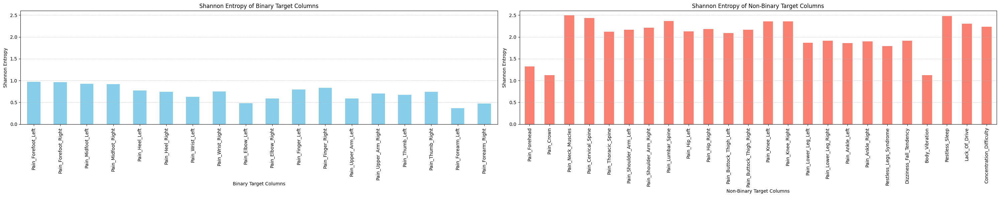

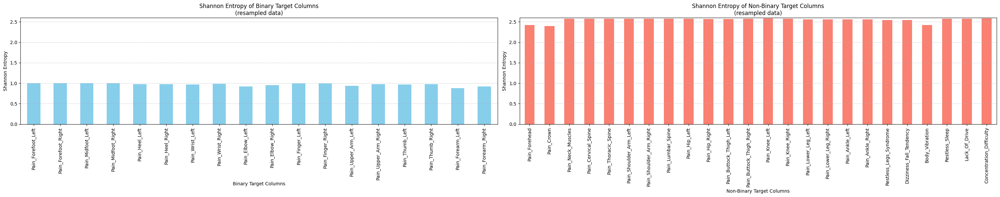

In [143]:
plot_shannon_entropy(entropy_info_processed_data, binary_target_columns, non_binary_target_columns, resampled=False)
plot_shannon_entropy(entropy_info_smtom_data_filled, binary_target_columns, non_binary_target_columns, resampled=True)


---

## 6. Evaluate the Distribution of Features between Original and Resampled Data
- Boxplot comparison 
    - Observation : Two datasets show similar distributions of features for each target column.
- Statistical Testing to check if two distributions come from the same underlying distribution (Null Hypothesis)  
    - Mann-Whitney U test for binary target columns
    - KS-Test for non-binary target columns 
    - Observation : Both have the high p-values, thus the two distributions come from the same underlying distribution (Null Hypothesis is not rejected) 

- Effect Size 
    - Mann-Whitney U test : (2 * statistic) / (n1 * n2) - 1 ( Rank Biserial Correlation ) 
    - KS-Test : KS statistic itself can be considered as an effect size measure
    - Guideline
        - ES $\lt$ 0.1 : very small / negligible
        - 0.1 $\le$ ES $\lt$ 0.3 : small
        - 0.3 $\le$ ES < 0.5 : medium
        - 0.5 $\le$ ES : very large
https://woogi-tech.tistory.com/entry/Kolmogorov–Smirnov-test 

In [144]:
# print(smtom_data_filled.head())
# print(processed_data.head())

#### 6.1. Boxplot comparison 
Obaservation
- Two datasets show similar distributions of features for each target column. 

In [145]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_binary_target_boxplots(features, binary_targets):
    # Determine the number of subplots needed
    n_cols = 5
    n_rows = len(binary_targets.columns)
    
    plt.figure(figsize=(30, n_rows * 5))
    
    # Plot for binary targets
    for idx, target_col in enumerate(binary_targets.columns):
        for jdx, feature_col in enumerate(features.columns):
            plt.subplot(n_rows, n_cols, idx * n_cols + jdx + 1)
            # if feature_col == 'ShoeSize':
            #     sns.countplot(x=features[feature_col], hue=non_binary_targets[target_col])
            # else:
            sns.boxplot(x=binary_targets[target_col], y=features[feature_col])
            plt.title(f'{feature_col} by {target_col}', fontsize=8)
            plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()

def plot_non_binary_target_boxplots(features, non_binary_targets):
    # Determine the number of subplots needed
    n_cols = 5
    n_rows = len(non_binary_targets.columns)
    
    plt.figure(figsize=(30, n_rows * 5))
    
    # Plot for non-binary targets
    for idx, target_col in enumerate(non_binary_targets.columns):
        for jdx, feature_col in enumerate(features.columns):
            plt.subplot(n_rows, n_cols, idx * n_cols + jdx + 1)
            # if feature_col == 'ShoeSize':
            #     sns.countplot(x=features[feature_col], hue=non_binary_targets[target_col])
            # else:
            sns.boxplot(x=non_binary_targets[target_col], y=features[feature_col])
            plt.title(f'{feature_col} by {target_col}', fontsize=8)
            plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()

#### Binary Targets

Resampled Data 

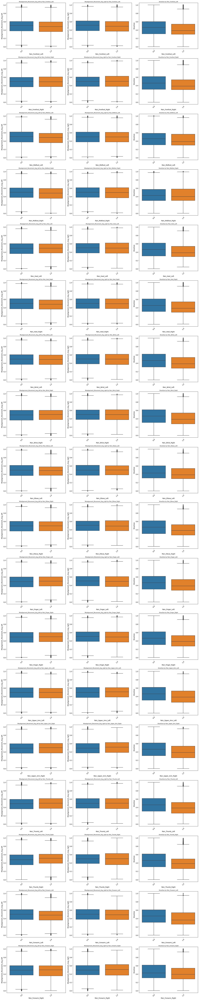

In [146]:
# Plots for resampled data
plot_binary_target_boxplots(smtom_data_filled[new_feature_columns], smtom_data_filled[binary_target_columns])

Original Data ( Processed Data )

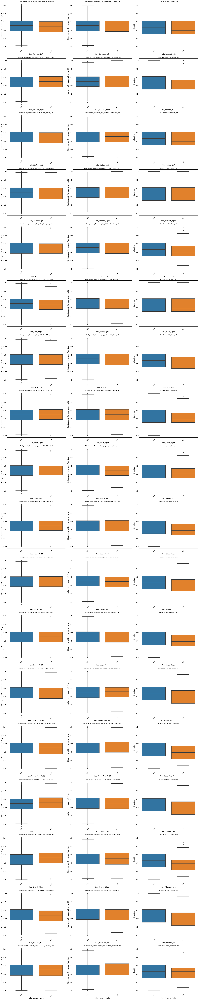

In [147]:
# Plots for original data
plot_binary_target_boxplots(processed_data[new_feature_columns], processed_data[binary_target_columns])

#### Non-binary Targets 

Resampled Data

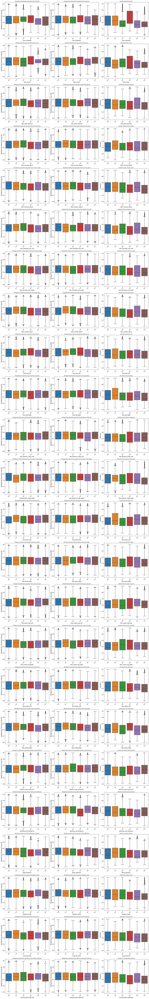

In [148]:
# plots for resampled data
plot_non_binary_target_boxplots(smtom_data_filled[new_feature_columns], smtom_data_filled[non_binary_target_columns])

Original Data ( Processed Data )

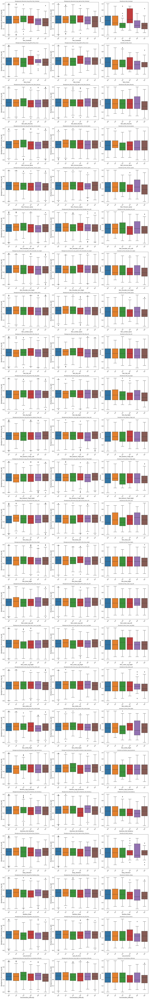

In [149]:
# Original Data 
plot_non_binary_target_boxplots(processed_data[new_feature_columns], processed_data[non_binary_target_columns])

#### 6.2. Statistical Testing to check if two distributions come from the same underlying distribution 

In [150]:
from scipy.stats import ks_2samp, mannwhitneyu, wilcoxon
import numpy as np

def compare_feature_distributions(df1, df2, feature_columns):
    results = {}
    for feature in feature_columns:
        if feature == 'ShoeSize':
            # Use Mann-Whitney U test for ShoeSize
            statistic, p_value = mannwhitneyu(df1[feature], df2[feature], alternative='two-sided')
            test_name = 'Mann-Whitney U'
            
            # Calculate effect size
            n1 = len(df1[feature])
            n2 = len(df2[feature])
            effect_size = (2 * statistic) / (n1 * n2) - 1
        else:
            # Use KS test for other features
            statistic, p_value = ks_2samp(df1[feature], df2[feature])
            test_name = 'KS-Test'
            
            # Calculate effect size for KS-Test
            effect_size = statistic  # The KS statistic itself can be considered as an effect size measure
        
        results[feature] = {
            'test': test_name,
            'statistic': statistic,
            'p_value': p_value,
            'effect_size': effect_size
        }
        
    # Print results
    for feature, result in results.items():
        print(f"Feature: {feature}")
        print(f"Test: {result['test']}")
        print(f"Statistic: {result['statistic']:.4f}, p-value: {result['p_value']:.4f}")
        if result['effect_size'] is not None:
            print(f"Effect Size: {result['effect_size']:.4f}")
        if result['effect_size'] < 0.1:
            print(f"- Effect Size is very small : The two distributions are similar")
        elif result['effect_size'] < 0.3:
            print(f"Effect Size is small")
        elif result['effect_size'] < 0.5:
            print(f"- Effect Size is medium")
        else:
            print(f"- Effect Size is very large")
        print("-" * 40) 
    
    return results

In [151]:
distribution_comparison_results = compare_feature_distributions(processed_data, smtom_data_filled, new_feature_columns)

Feature: Misalignment_Movement_Avg_left
Test: KS-Test
Statistic: 0.0231, p-value: 0.2915
Effect Size: 0.0231
- Effect Size is very small : The two distributions are similar
----------------------------------------
Feature: Misalignment_Movement_Avg_right
Test: KS-Test
Statistic: 0.0241, p-value: 0.2460
Effect Size: 0.0241
- Effect Size is very small : The two distributions are similar
----------------------------------------
Feature: ShoeSize
Test: Mann-Whitney U
Statistic: 93475773.5000, p-value: 0.0470
Effect Size: 0.0271
- Effect Size is very small : The two distributions are similar
----------------------------------------


## 7. Evaluate the Correlation between Features and Targets from Original and Resampled Data

- Statistical Testing to check if the correlation between features and targets significantly changes after oversampling 
    - Point-Biserial Correlation for binary targets
    - Kendall Tau for non-binary targets
    - Observation : The correlation between features and targets does not change significantly after oversampling. 
- Same method from *EDA_1 - 6. Correlation between features and targets*
- Guideliens : 
    - Association Analysis
        - Point-Biserial Correlation Coefficient ( continuous data - dichotomous data/binary category ) : Feature Columns(except for ShoeSize) vs True/False Targets  
            - measures the correlation between a numeric variable and a binary variable
            - coefficient range : -1 ~ 1 
            - coefficient interpretation 
                - absolute valeu $\ge$ 0.6 : strong correlation 
                - 0.6 $\gt$ absolute value $\ge$ 0.3 : moderate correlation 
                - 0.3 $\gt$ absolute value $\ge$ 0 : weak correlation 
        - Kendall's Tau($\tau$) rank correlation coefficient ( continuous data - ordinal data & ordinal data/discrete data - ordinal data ) : Feature Columns(except for ShoeSize) vs Pain Severity(0~5) & ShoeSize(discrete) vs Pain Severity(0~5)
            - Rank based, non-parametric correlation coefficient
            - coefficient range : -1 ~ 1 
            - coefficient interpretation 
                - |$\tau$| $\ge$ 0.3 : meaningful relation 
                - |$\tau$| $\ge$ 0.5 : strong relation 
- Observation   
    - Same patterns are shown in both feature vs binary target and feature vs non-binary target
        - The correlations between features and targets in both dataset(imbalance data vs resampled_data ) are relatively unchanged.
        - Some of insignificant correlations in the imbalanced datasets(non-red bars) became significant in the resampled data.
            - `**SMOTE + Tomek Links** added some meaningful patterns into the data**` ( it may be the latent patterns hidden in the imbalanced data or because SMOTE added a false pattern )
        - The correlation values are still very low
            - Even if there are statistically significant correlation, the effect is still very low. 
        - `**Compared to EDA_2_1 SMOTE, the correlation values(Effect Size) between features and targets increased**`

Measure of Association ( Text Book ) : https://journals.sagepub.com/doi/pdf/10.1177/8756479308317006   
https://stats.stackexchange.com/questions/73065/correlation-coefficient-between-a-non-dichotomous-nominal-variable-and-a-numer 

In [152]:
# print(smtom_data_filled.head())
# print(processed_data.head())

#### 7.1. Define a function to calculate the correlation between features and targets 

In [153]:
#### Correlation between features and targets 
# Since the feature columns are not perfectly normally distributed, the non-parametric correlation test is used.

# Point-Biserial Correlation for binary targets
from scipy import stats

def calculate_point_biserial_correlations(features, binary_targets):
    correlations = {}
    for target_col in binary_targets.columns:
        for feature_col in features.columns:
            correlation, p_value = stats.pointbiserialr(binary_targets[target_col], features[feature_col])
            correlations[(feature_col, target_col)] = {
                'correlation': correlation,
                'p_value': p_value
            }
    
    # Convert to DataFrame
    corr_df = pd.DataFrame([
        {
            'Feature': feat,
            'Target': targ,
            'Corr': val['correlation'],
            'p-value': val['p_value']
        }
        for (feat, targ), val in correlations.items()
    ])
    
    # Sort by absolute correlation
    corr_df['Abs_Corr'] = abs(corr_df['Corr'])
    corr_df = corr_df.sort_values('Abs_Corr', ascending=False)
    corr_df = corr_df.drop('Abs_Corr', axis=1)
    
    return corr_df

def calculate_kendall_tau(features, binary_targets):
    results = []
    for target_col in binary_targets.columns:
        for feature_col in features.columns:
            tau, p_value = stats.kendalltau(features[feature_col], binary_targets[target_col])
            results.append({
                'Feature': feature_col, 
                'Target': target_col,
                'Tau': tau,
                'p-value': p_value
            })
    return pd.DataFrame(results).sort_values('Tau', ascending=False)

In [154]:
# Get the correlation results of original and resampled data 

p_biserial_result_original = calculate_point_biserial_correlations(
    processed_data[new_feature_columns],
    processed_data[binary_target_columns]
).reset_index(drop=True)

k_tau_result_original = calculate_kendall_tau(
    processed_data[new_feature_columns],
    processed_data[binary_target_columns]
).reset_index(drop=True)

p_biserial_result_resampled = calculate_point_biserial_correlations(
    smtom_data_filled[new_feature_columns],
    smtom_data_filled[binary_target_columns]
).reset_index(drop=True)

k_tau_result_resampled = calculate_kendall_tau(
    smtom_data_filled[new_feature_columns],
    smtom_data_filled[binary_target_columns]
).reset_index(drop=True)

#### 7.2. Correlation between features and **binary targets** ( Point-Biserial Correlation )

##### 7.2.1. Merge the correlation results of original(processed data) and resampled data 
- XXX_1 : Original Data(Processed Data)
- XXX_2 : Resampled Data

In [155]:
merged_p_biserial_result = p_biserial_result_original.merge(p_biserial_result_resampled, on=['Feature', 'Target'], suffixes=('_1', '_2'))
merged_p_biserial_result[['Corr_1', 'Corr_2']] = merged_p_biserial_result[['Corr_1', 'Corr_2']].apply(abs)
merged_p_biserial_result['Corr_diff'] = abs(merged_p_biserial_result['Corr_1'] - merged_p_biserial_result['Corr_2'])

In [156]:
merged_p_biserial_result.head()

,Feature,Target,Corr_1,p-value_1,Corr_2,p-value_2,Corr_diff
0,ShoeSize,Pain_Thumb_Right,0.157938,1.253397e-11,0.210599,0.0,0.052661
1,ShoeSize,Pain_Finger_Right,0.134937,7.581165e-09,0.186782,0.0,0.051845
2,ShoeSize,Pain_Upper_Arm_Right,0.116656,6.070277e-07,0.175756,0.0,0.059100
3,ShoeSize,Pain_Thumb_Left,0.111517,1.862718e-06,0.164290,0.0,0.052773
4,ShoeSize,Pain_Wrist_Left,0.093310,6.730120e-05,0.150580,0.0,0.057269


##### 7.2.2. Melt the merged dataframe for plotting

In [157]:
import matplotlib.pyplot as plt
import numpy as np

# Melt the DataFrame for correlation values
melted_correlation = merged_p_biserial_result.melt(
    id_vars=['Feature', 'Target'],
    value_vars=['Corr_1', 'Corr_2'],
    var_name='Corr_Type',
    value_name='Corr_Value'
)

# Melt the DataFrame for p-values
melted_p_value = merged_p_biserial_result.melt(
    id_vars=['Feature', 'Target'],
    value_vars=['p-value_1', 'p-value_2'],
    var_name='p_value_Type',
    value_name='p_value'
)

# Merge the two melted DataFrames
melted_data_p_biserial = pd.merge(melted_correlation, melted_p_value, on=['Feature', 'Target'])

# Create a new column combining Feature and Target
melted_data_p_biserial['Feature_Target'] = melted_data_p_biserial['Feature'] + ' vs ' + melted_data_p_biserial['Target']

# Reduce redundant rows 
melted_data_p_biserial = melted_data_p_biserial[
    ((melted_data_p_biserial['Corr_Type'] == 'Corr_1') & (melted_data_p_biserial['p_value_Type'] == 'p-value_1')) |
    ((melted_data_p_biserial['Corr_Type'] == 'Corr_2') & (melted_data_p_biserial['p_value_Type'] == 'p-value_2'))
]

# Sort the DataFrame by 'Corr_Value'
melted_data_p_biserial = melted_data_p_biserial.sort_values(by='Corr_Value')

##### 7.2.3. Plot the correlation between features and binary targets 

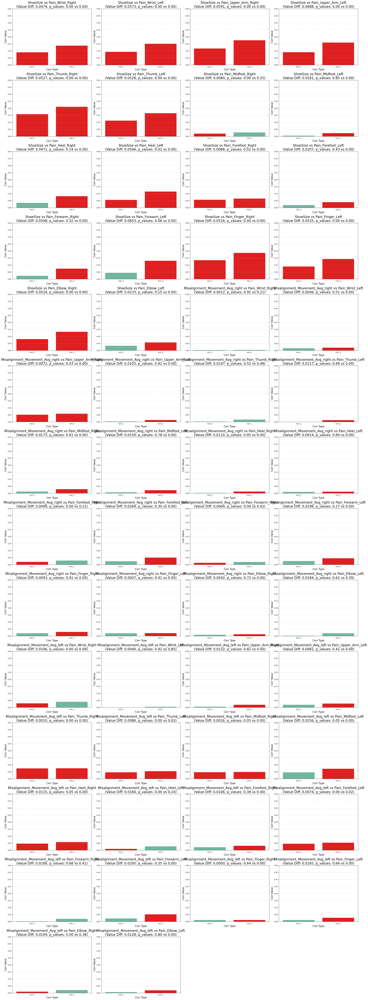

In [174]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Create individual graphs for each Feature_Target
unique_pairs = melted_data_p_biserial['Feature_Target'].unique()
n_cols = 4
n_rows = (len(unique_pairs) + n_cols - 1) // n_cols

plt.figure(figsize=(30, n_rows * 6))

# Sort the data by 'Corr_2' values in descending order
sorted_pairs = melted_data_p_biserial.sort_values(by=['Feature', 'Target'], ascending=False)['Feature_Target'].unique()

# Iterate over each unique pair and plot
for idx, pair in enumerate(sorted_pairs):
    subset = melted_data_p_biserial[melted_data_p_biserial['Feature_Target'] == pair]
    
    # Extract data for plotting
    corr_types = subset['Corr_Type'].values
    corr_values = subset['Corr_Value'].values
    p_values = subset['p_value'].values
    
    # Get the value difference between the two tau values
    value_diff = abs(corr_values[0] - corr_values[1])
    
    # Get P-Value
    p_val_1, p_val_2 = p_values[0], p_values[1]
    
    # Determine bar colors based on p-values
    bar_colors = ['red' if p < 0.05 else '#66c2a5' for p in p_values]
    
    # Use plt.subplot to create subplots
    plt.subplot(n_rows, n_cols, idx + 1)
    sns.barplot(x=corr_types, y=corr_values, palette=bar_colors)
    plt.title(f'{pair}\n(Value Diff: {value_diff:.4f}, p_values: {p_val_1:.02f} vs {p_val_2:.02f})', fontsize=20)
    plt.xlabel('Corr Type', fontsize=15)
    plt.ylabel('Corr Value', fontsize=15)
    plt.ylim(0, 0.4)
    plt.gca().yaxis.set_major_locator(plt.MultipleLocator(0.05))
    plt.grid(True, which='major', axis='y', linestyle='--', linewidth=0.5) 

plt.tight_layout()
plt.show()

#### 7.3. Correlation between features and **non-binary targets** ( Kendall Tau )

##### 7.3.1. Merge the correlation results of original(processed data) and resampled data 
- XXX_1 : Original Data(Processed Data)
- XXX_2 : Resampled Data

In [159]:
merged_k_tau_result = k_tau_result_original.merge(k_tau_result_resampled, on=['Feature', 'Target'], suffixes=('_1', '_2'))
merged_k_tau_result[['Tau_1', 'Tau_2']] = merged_k_tau_result[['Tau_1', 'Tau_2']].apply(abs)
merged_k_tau_result['Tau_diff'] = abs(merged_k_tau_result['Tau_1'] - merged_k_tau_result['Tau_2'])

##### 7.3.2. Melt the merged dataframe for plotting

In [160]:
import matplotlib.pyplot as plt
import numpy as np

# Melt the dataframe to transform it into a format suitable for visualization
# Melt Tau values
melted_tau = merged_k_tau_result.melt(
    id_vars=['Feature', 'Target'],
    value_vars=['Tau_1', 'Tau_2'],
    var_name='Tau_Type',
    value_name='Tau_Value'
)

# Melt p-value values
melted_p_value = merged_k_tau_result.melt(
    id_vars=['Feature', 'Target'],
    value_vars=['p-value_1', 'p-value_2'],
    var_name='P_Value_Type',
    value_name='P_Value'
)

# Merge the two dataframes
melted_data_k_tau = pd.merge(melted_tau, melted_p_value, on=['Feature', 'Target'])

# Combine Feature and Target to create a new column
melted_data_k_tau['Feature_Target'] = melted_data_k_tau['Feature'] + ' vs ' + melted_data_k_tau['Target']

# Reduce redundant rows 
melted_data_k_tau = melted_data_k_tau[
    ((melted_data_k_tau['Tau_Type'] == 'Tau_1') & (melted_data_k_tau['P_Value_Type'] == 'p-value_1')) |
    ((melted_data_k_tau['Tau_Type'] == 'Tau_2') & (melted_data_k_tau['P_Value_Type'] == 'p-value_2'))
]

melted_data_k_tau

,Feature,Target,Tau_Type,Tau_Value,P_Value_Type,P_Value,Feature_Target
0,Misalignment_Movement_Avg_left,Pain_Thumb_Right,Tau_1,0.062703,p-value_1,0.001125,Misalignment_Movement_Avg_left vs Pain_Thumb_R...
2,Misalignment_Movement_Avg_left,Pain_Thumb_Left,Tau_1,0.043305,p-value_1,0.024478,Misalignment_Movement_Avg_left vs Pain_Thumb_Left
4,Misalignment_Movement_Avg_right,Pain_Upper_Arm_Right,Tau_1,0.037548,p-value_1,0.051020,Misalignment_Movement_Avg_right vs Pain_Upper_...
6,Misalignment_Movement_Avg_left,Pain_Wrist_Right,Tau_1,0.029442,p-value_1,0.126159,Misalignment_Movement_Avg_left vs Pain_Wrist_R...
8,Misalignment_Movement_Avg_right,Pain_Forefoot_Right,Tau_1,0.021057,p-value_1,0.273839,Misalignment_Movement_Avg_right vs Pain_Forefo...
...,...,...,...,...,...,...,...
207,ShoeSize,Pain_Wrist_Left,Tau_2,0.119453,p-value_2,0.000000,ShoeSize vs Pain_Wrist_Left
209,ShoeSize,Pain_Thumb_Left,Tau_2,0.137913,p-value_2,0.000000,ShoeSize vs Pain_Thumb_Left
211,ShoeSize,Pain_Upper_Arm_Right,Tau_2,0.146819,p-value_2,0.000000,ShoeSize vs Pain_Upper_Arm_Right
213,ShoeSize,Pain_Finger_Right,Tau_2,0.151871,p-value_2,0.000000,ShoeSize vs Pain_Finger_Right


##### 7.3.3. Plot the correlation between features and non-binary targets 

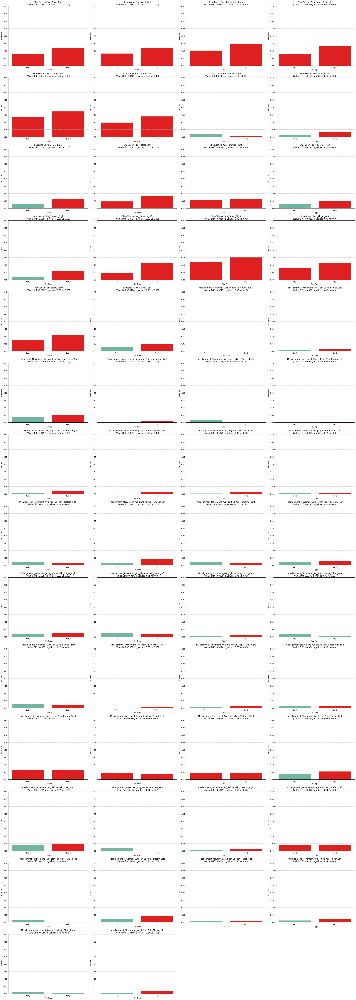

In [169]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Create individual graphs for each Feature_Target
unique_pairs = melted_data_k_tau['Feature_Target'].unique()
n_cols = 4
n_rows = (len(unique_pairs) + n_cols - 1) // n_cols

plt.figure(figsize=(30, n_rows * 6))

# Sort the data by 'Tau_2' values in descending order
sorted_pairs = melted_data_k_tau.sort_values(by=['Feature', 'Target'], ascending=False)['Feature_Target'].unique()

# Iterate over each unique pair and plot
for idx, pair in enumerate(sorted_pairs):
    subset = melted_data_k_tau[melted_data_k_tau['Feature_Target'] == pair]
    
    # Extract data for plotting
    tau_types = subset['Tau_Type'].values
    tau_values = subset['Tau_Value'].values
    p_values = subset['P_Value'].values
    
    # Get the value difference between the two tau values
    value_diff = tau_values[0] - tau_values[1]
    
    # Get P-Value
    p_val_1, p_val_2 = p_values[0], p_values[1]
    
    # Determine bar colors based on p-values
    bar_colors = ['red' if p < 0.05 else '#66c2a5' for p in p_values]
    
    # Use plt.subplot to create subplots
    plt.subplot(n_rows, n_cols, idx + 1)
    sns.barplot(x=tau_types, y=tau_values, palette=bar_colors)
    plt.title(f'{pair}\n(Value Diff: {value_diff:.4f}, p_values: {p_val_1:.02f} vs {p_val_2:.02f})')
    plt.xlabel('Tau Type')
    plt.ylabel('Tau Value')
    plt.ylim(0, 0.4)
    plt.gca().yaxis.set_major_locator(plt.MultipleLocator(0.05))
    plt.grid(True, which='major', axis='y', linestyle='--', linewidth=0.5) 

plt.tight_layout()
plt.show()

## 8.Assessing the Impact of Resampled Feature Variables(SMOTE + Tomek Links) on Group Differentiation

Process 

- Equal Variance Test 
    - Levene's Test (Continuous / Discrete Values)
        - Measures the variance of feature values per class in each target column.
    - Purpose of Equal Variance Test
        - Some statistical tests, such as t-test and ANOVA, assume that the variance of feature values per class in each target column is equal.
        - If equal variance → t-test for binary targets, ANOVA for non-binary targets can be used.
        - If unequal variance → Non-parametric tests (Welch's t-test for binary targets, Kruskal-Wallis test for non-binary targets) should be used.
    - Equal Variance Test is not necessary if Welch's t-test and Kruskal Wallis test are used (less strict restrictions)
    - Obesrvation 
        - Only a few pairs of features and targets have equal variance, so non-parametric tests are used.

- Test Mean(Median) Difference of Feature Variables across Classes for every Target Column 
    - Welch's t-test for feature variables across classes for each binary target columns 
    - Kruskal-Wallis test for feature variables across classes for each non-binary target columns 
    - The purpose of these tests is to determine whether the mean (or median in non-parametric tests) of feature values differs across target classes. 
        - If the means (or medians) are equal, then the feature does not significantly contribute to distinguishing between     different classes in the target column.
        - If they are different, the feature may be important for classification.
    - Observation 
        - [most of augmented features(resampled samples) now have different means(medians) across classes for each target column]

https://en.wikipedia.org/wiki/Levene%27s_test (normality not required)  
https://www.itl.nist.gov/div898/handbook/eda/section3/eda35a.htm  
Bartlett's test (normality required)  
Fligner-Killeen Test ( Robust against non-normality)

In [162]:
# smtom_data_filled.head()

#### 8.1. Equal Variance Test 
- Not necessary if Welch's t-test and Kruskal Wallis test are used (less strict restrictions)

In [163]:
import pandas as pd
from scipy.stats import levene

# Function to perform Levene's test for each feature against each target class
def levene_test(feature_data, target_data):
    results = []
    for target_col in target_data.columns:
        for feature_col in feature_data.columns:
            # Get unique classes in the target column
            unique_classes = target_data[target_col].unique()
            
            # Create groups for each unique class
            groups = []
            for cls in unique_classes:
                # Get the data for feature_col where the target column equals the current class
                # Then, drop any missing values from this data
                group_data = feature_data.loc[target_data[target_col] == cls, feature_col].dropna()
                groups.append(group_data)
            
            # Perform Levene's test
            stat, p_value = levene(*groups)
            
            results.append({
                'Feature': feature_col,
                'Target': target_col,
                'Levene Stat': stat,
                'p-value': p_value
            })
    
    return pd.DataFrame(results).sort_values('p-value')

In [176]:
feature_smtom_data_filled = smtom_data_filled[new_feature_columns]
target_smtom_data_filled = smtom_data_filled[target_columns]

# Perform Levene's test
levene_results = levene_test(feature_smtom_data_filled, target_smtom_data_filled)

# Display results
print(f'Number of features with significant difference in variance: {len(levene_results[levene_results["p-value"] < 0.05])}')
print(f'Number of features with no significant difference in variance: {len(levene_results) - len(levene_results[levene_results["p-value"] < 0.05])}')

Number of features with significant difference in variance: 121
Number of features with no significant difference in variance: 5


#### 8.2. Perform Welch's t-test and Kruskal-Wallis test 

In [177]:
import pandas as pd
from scipy.stats import ttest_ind, levene
from scipy.stats import kruskal

# Function to perform Welch's t-test for binary target columns
def welch_t_test(feature_data_clean_no_outliers, binary_targets):
    results = []
    for target_col in binary_targets.columns:
        for feature_col in feature_data_clean_no_outliers.columns:
            # Get data for the two groups
            group1 = feature_data_clean_no_outliers[feature_col][binary_targets[target_col] == 0]
            group2 = feature_data_clean_no_outliers[feature_col][binary_targets[target_col] == 1]
            
            # Perform Welch's t-test
            t_stat, p_value = ttest_ind(group1, group2, equal_var=False)
            
            results.append({
                'Feature': feature_col,
                'Target': target_col,
                't-statistic': t_stat,
                'p-value': p_value
            })
    
    return pd.DataFrame(results).sort_values('p-value')

# Function to perform Kruskal-Wallis test for non-binary target columns
def kruskal_wallis_test(feature_data_clean_no_outliers, non_binary_targets):
    results = []
    for target_col in non_binary_targets.columns:
        for feature_col in feature_data_clean_no_outliers.columns:
            # Get unique classes in the target column
            unique_classes = non_binary_targets[target_col].unique()
            
            # Create groups for each unique class.
            groups = []
            for cls in unique_classes:
                # Get the data for feature_col corresponding to the current class and drop missing values.
                group_data = feature_data_clean_no_outliers[feature_col][non_binary_targets[target_col] == cls].dropna()
                # Add the group data to the list.
                groups.append(group_data)
            
            # Perform Kruskal-Wallis test
            stat, p_value = kruskal(*groups)
            
            results.append({
                'Feature': feature_col,
                'Target': target_col,
                'Kruskal-Wallis Stat': stat,
                'p-value': p_value
            })
    
    return pd.DataFrame(results).sort_values('p-value')

In [178]:
feature_smtom_data_filled = smtom_data_filled[new_feature_columns]
binary_target_smtom_data_filled = smtom_data_filled[binary_target_columns]
non_binary_target_smtom_data_filled = smtom_data_filled[non_binary_target_columns]

# Perform Welch's t-test
welch_results = welch_t_test(feature_smtom_data_filled, binary_target_smtom_data_filled)

# Perform Kruskal-Wallis Test 
kruskal_results = kruskal_wallis_test(feature_smtom_data_filled, non_binary_target_smtom_data_filled)

#### 8.3. Plot the results of welch's t-test and kruskal-wallis test ( Only the values with p-value < 0.05 are colored )

In [179]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_results_heatmap(welch_results, kruskal_results):
    plt.figure(figsize=(20, 5))
    
    # Welch's t-test results heatmap
    plt.subplot(1, 2, 1)
    welch_pivot = welch_results.pivot(index='Feature', columns='Target', values='p-value')
    sns.heatmap(welch_pivot, cmap='coolwarm', annot=True, fmt=".2f", cbar_kws={'label': 'p-value'},
                linecolor='black', linewidths=0.5, # Add grid lines
                vmin=0, vmax=1) 
    plt.title("Welch's t-test Results")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    
    # Kruskal-Wallis test results heatmap
    plt.subplot(1, 2, 2)
    kruskal_pivot = kruskal_results.pivot(index='Feature', columns='Target', values='p-value')
    sns.heatmap(kruskal_pivot, cmap='coolwarm', annot=True, fmt=".2f", cbar_kws={'label': 'p-value'},
                linecolor='black', linewidths=0.5,
                vmin=0, vmax=1) 
    plt.title("Kruskal-Wallis Test Results")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    
    plt.tight_layout()
    plt.show()

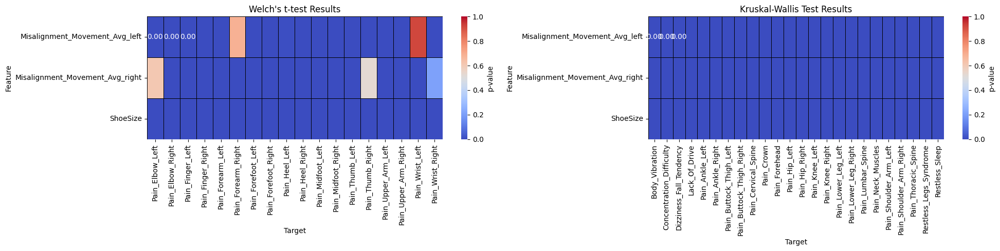

In [180]:
# Call the function with your results
plot_results_heatmap(welch_results, kruskal_results)

---

## Conclusion - EDA_2_1_SMOTE + Tomek Links 
Results are similar to DEA_2_1 

- Feature Selection
    - Features are selected based on the results from EDA_1 
    - Drop columns : Gait_Avg_right, Gait_Avg_left, Misalignment_Rest_Avg_right, Misalignment_Rest_Avg_left
    - Used columns : Misalignmnet_Movement_Avg_left, Misalignmnet_Movement_Avg_right, ShoeSize
- Imbalanced Data 
    - The original data is severely imbalanced in many columns.
    - Augmenting(resampling) the data using SMOTE + Tomek Links improved the balance in the data.
        - Shannon Entropy marked the max values in most of the target columns.
        - `Slightly improved balanced across classes per each column compared to EDA_2_1_SMOTE` 
- Using SMOTE + Tomek Links did not meaningfully affect the population distribution of the data. ( Section 6 ) 
    - KS Test and Mann-Whitney U Test results showed that the population distribution of the original data and the augmented(resampled) data cannot be differentiated.
- Augmented(resampled) Data improved the *correlation* between features and the target values.  
    - The correlation values between features and the target values are still very low(point-biserial coefficients and $\tau$ values).
    - However, after resampling the data using SMOTE, the correlaion between many features and the target values became statistically significant. 
    - `Slightly increased correlation strength compared to EDA_2_1_SMOTE`

- Augmented(resampled) Data made better distinction between feature values within classes for each target column. 
    - Welch's t-test and Kruskal-Wallis test results showed that the mean(median) values of the augmented(resampled) data are significantly different across classes for most of the target columns. 
    - `Slightly improved distinction across classes per target column (the feature distributions across classes per target column are slightly more distinctive)` 